# TESTING MATERIAL | SMIF Quantitative Portfolio Management & Risk
This is a **testing and reference capstone** for the SMIF Quantitative Division at FIU, focused on applied **portfolio management, risk analysis, visualization, and portfolio optimization using Python**. Use it to explore the workflow, experiment with the code, and become familiar with the tools and some concepts we will build on throughout the semester.

# Before Running This Notebook
| Requirement | Use This |
|---|---|
| **Conda environment** | `smif-quant` |
| **Python** | `3.14` |
| **Kernel** | `Python (smif-quant)` |
| **Interface** | JupyterLab or VS Code |

> **You are not expected to already have `smif-quant`.**  
> The repository's `environment.yml` file creates it for you.

## First-time setup
1. **Install Anaconda:** https://www.anaconda.com/download
2. **Download the entire GitHub repository** and extract the ZIP.
3. Open **Anaconda Prompt**.
4. Navigate to the extracted `smif-quant-files` folder.
5. Create the division environment:

```bash
conda env create -f environment.yml

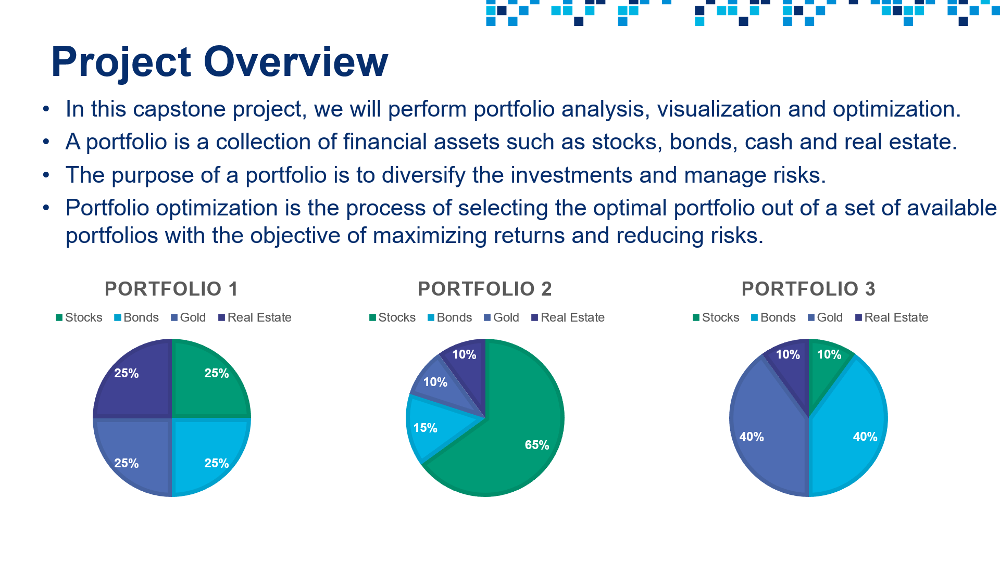

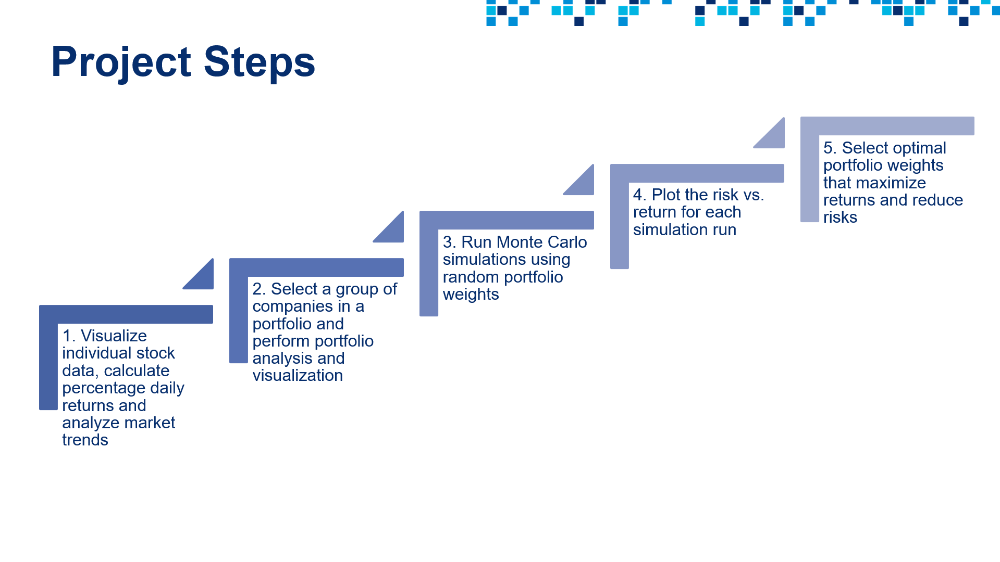

# IMPORT LIBRARIES AND DATASETS

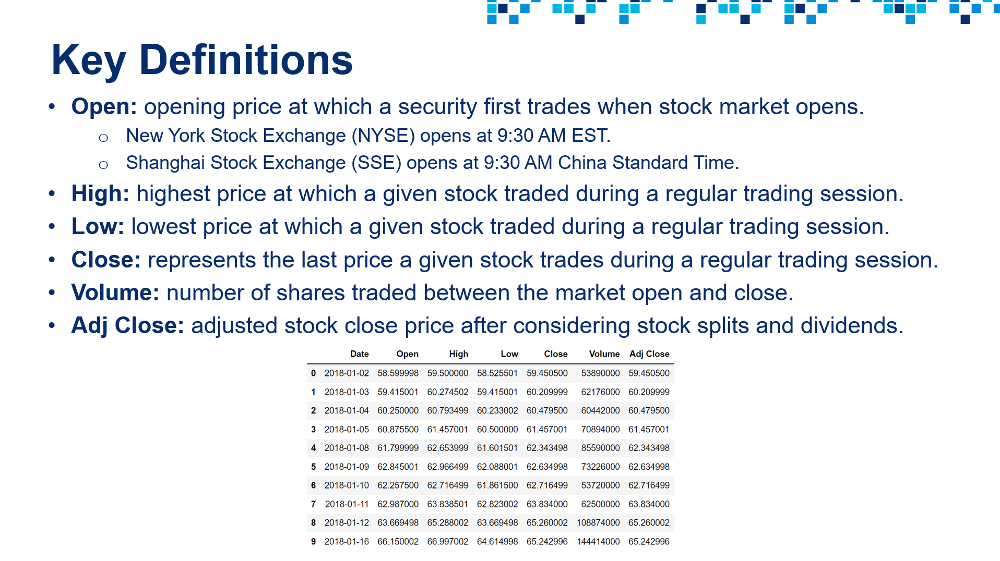

In [1]:
%matplotlib inline
# Import key librares and modules 
import pandas as pd
import numpy as np

# Import datetime module that comes pre-installed in Python 
# datetime offers classes that work with date & time information
import datetime as dt
    

In [2]:
# Use Pandas to read attached stock data
import pandas as pd

stock_df = pd.read_csv('Amazon.csv')
stock_df.head(15) #show the first 15 rows of the data frame

,Date,Open,High,Low,Close,Volume,Adj Close
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498
5,1/9/2018,62.845001,62.966499,62.088001,62.634998,73226000,62.634998
6,1/10/2018,62.257500,62.716499,61.861500,62.716499,53720000,62.716499
7,1/11/2018,62.987000,63.838501,62.823002,63.834000,62500000,63.834000
8,1/12/2018,63.669498,65.288002,63.669498,65.260002,108874000,65.260002
9,1/16/2018,66.150002,66.997002,64.614998,65.242996,144414000,65.242996


In [3]:
# Count the number of missing values in "stock_df" Pandas DataFrame
stock_df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [4]:
# Obtain information about the "Pandas DataFrame" itself such as data types, memory utilization..etc
stock_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 1250 entries, 0 to 1249
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1250 non-null   str    
 1   Open       1250 non-null   float64
 2   High       1250 non-null   float64
 3   Low        1250 non-null   float64
 4   Close      1250 non-null   float64
 5   Volume     1250 non-null   int64  
 6   Adj Close  1250 non-null   float64
dtypes: float64(5), int64(1), str(1)
memory usage: 68.5 KB


**PRACTICE OPPORTUNITY:**
- **Using Pandas library, read JPMorgan Chase & Co. stock prices data contained in "JPM.csv" file and place it in a Pandas DataFrame titled "JPM_df"**
- **Count the number of Null or missing values in "JPM_df" Pandas DataFrame**
- **What is the memory usage of "JPM_df" Pandas DataFrame?**

In [5]:
#Jupyter automatically displays only the last object in a cell, hence import IPython.display to display multiple objects in a single cell
#call the display function to show outputs

#Present both tables in a more readable format using the display function from IPython.display module
from IPython.display import display

# Use Pandas to read jpm csv attached stock data
jpm_df = pd.read_csv('JPM.csv')

#display a title for the JPM stock data
display("JPM stock data:") 
#show the first 5 rows of the data frame
display(jpm_df.head(5)) 


#Number of missing values in the JPM stock data using isnull().sum()
display("Number of missing values in JPM stock data:")
display(jpm_df.isnull().sum())

# display memory usage of JPM_df

'JPM stock data:'

,Date,Open,High,Low,Close,Adj Close,Volume
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700


'Number of missing values in JPM stock data:'

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [6]:
import pandas as pd

jpm_df = pd.read_csv('JPM.csv') 

#check memory usage of JPM_df DataFrame
jpm_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 1368 entries, 0 to 1367
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1368 non-null   str    
 1   Open       1368 non-null   float64
 2   High       1368 non-null   float64
 3   Low        1368 non-null   float64
 4   Close      1368 non-null   float64
 5   Adj Close  1368 non-null   float64
 6   Volume     1368 non-null   int64  
dtypes: float64(5), int64(1), str(1)
memory usage: 74.9 KB


# CALCULATE PERCENTAGE DAILY RETURNS

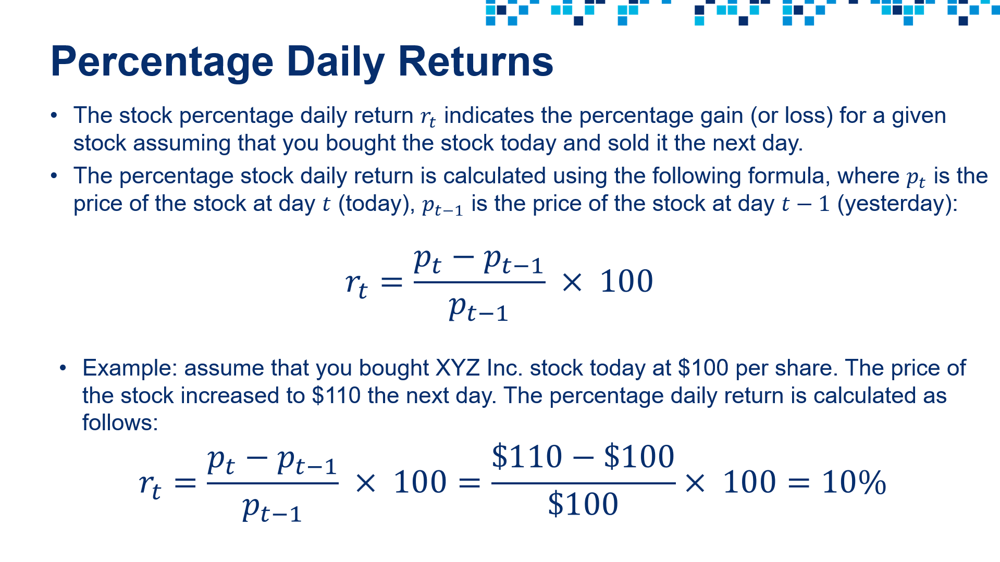

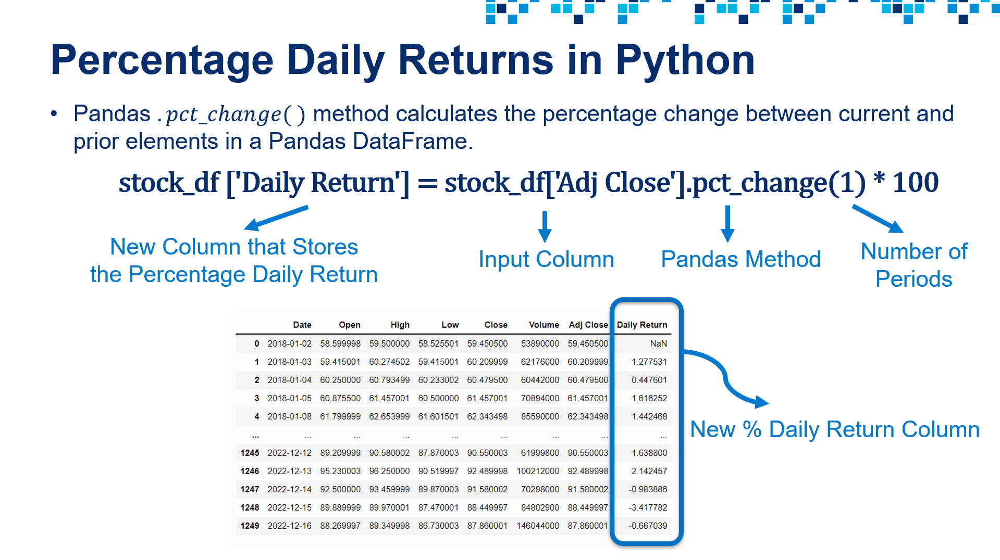

In [7]:
#Insert a new column in the "stock_df" DataFrame called "Daily Return" and use pandas' "pct_change()" to vertically the percentage daily return of the "Adj Close" one period at a time column and assign it to the new "Daily Return" column. Multiply the result by 100 to express it as a percentage.
# Calculate the percentage daily return
stock_df['Daily Return'] = stock_df['Adj Close'].pct_change(1) * 100
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,NaN
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [8]:
# Let's replace the first row with zeros instead of NaN
stock_df['Daily Return'] = stock_df['Daily Return'].replace(np.nan, 0)
stock_df


,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [9]:
# Using Amazon.csv
    # stock_df = pd.read_csv('Amazon.csv')

# Use the describe() method to obtain a statistical summary about the data 
    # Over the specified time period, the average adjusted close price for Amazon stock was $120.07 
    # The maximum adjusted close price was $186.57
    # The maximum volume of shares traded on one day were 311,346,000
stock_df.describe().round(2)

,Open,High,Low,Close,Volume,Adj Close,Daily Return
count,1250.00,1250.00,1250.00,1250.00,1.250000e+03,1250.00,1250.00
mean,120.15,121.59,118.54,120.07,8.670803e+07,120.07,0.06
std,35.66,36.04,35.23,35.59,4.077817e+07,35.59,2.25
min,58.60,59.50,58.53,59.45,1.762600e+07,59.45,-14.05
25%,89.21,89.90,88.10,89.13,5.897078e+07,89.13,-1.04
50%,108.29,111.70,106.86,108.73,7.515300e+07,108.73,0.12
75%,158.39,160.05,156.28,158.11,1.027046e+08,158.11,1.17
max,187.20,188.65,184.84,186.57,3.113460e+08,186.57,13.54


**PRACTICE OPPORTUNITY:**
- **Using the adjusted closing price, calculate the percentage daily return for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022.**
- **Calculate the maximum percentage daily return for JPMorgan Chase & Co. stock over the same time period.**

In [10]:
# create 'daily return' column for JPM stock data
# call percentage change of 'Adj Close' column and multiply by 100 to express it as a percentage

jpm_df['Daily Return'] = jpm_df['Adj Close'].pct_change(1) * 100
jpm_df

#jpm_df.describe().round(2)

,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,NaN
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000
...,...,...,...,...,...,...,...,...
1363,12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152
1364,12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867
1365,12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700
1366,12/15/2022,131.149994,132.080002,129.050003,130.100006,130.100006,12087800,-2.481072


In [11]:
# overall statistics
jpm_df.describe().round(2)

,Open,High,Low,Close,Adj Close,Volume,Daily Return
count,1368.00,1368.00,1368.00,1368.00,1368.00,1368.00,1367.00
mean,120.67,121.88,119.46,120.65,112.18,14413609.94,0.05
std,21.82,21.91,21.71,21.81,23.82,6503745.66,1.96
min,81.56,83.75,76.91,79.03,72.58,3220500.00,-14.96
25%,104.73,105.70,103.73,104.76,93.91,10228700.00,-0.83
50%,114.51,115.41,113.44,114.53,102.74,12855450.00,0.00
75%,134.89,136.45,133.94,135.29,128.46,16357600.00,0.96
max,172.71,172.96,170.54,171.78,166.52,54418800.00,18.01


In [12]:
# maximum percentage daily return for JPM stock
jpm_df['Daily Return'].max().round(2) 

print("The maximum daily return for JPM was {}%".format(jpm_df['Daily Return'].max().round(2)))

# I always forget to put .format()

The maximum daily return for JPM was 18.01%


# PERFORM DATA VISUALIZATION FOR A SINGLE STOCK: PART 1

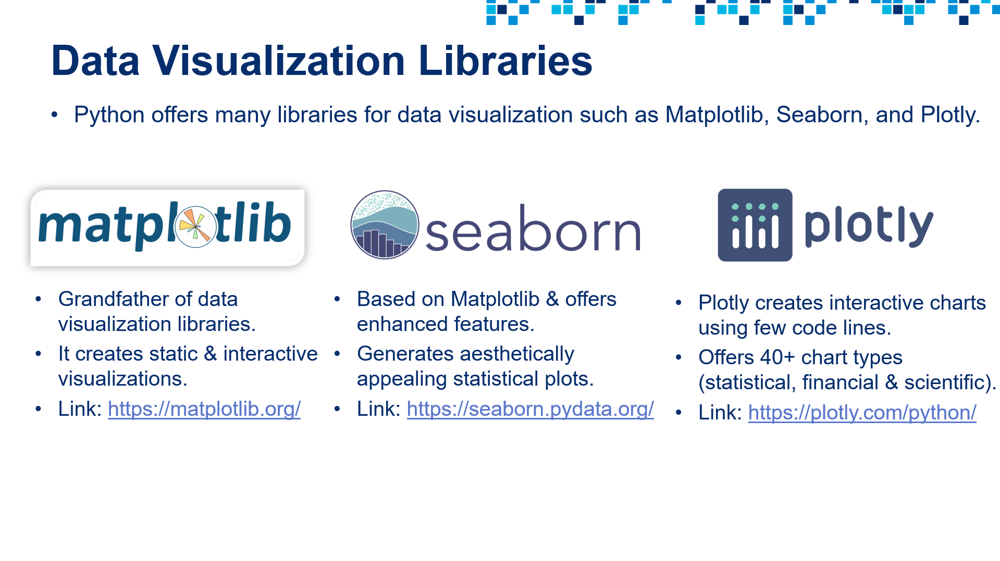

- Link to Matplotlib Documentation: https://matplotlib.org/
- Link to Seaborn Documentation: https://seaborn.pydata.org/
- Link to Plotly Documentation: https://plotly.com/python/

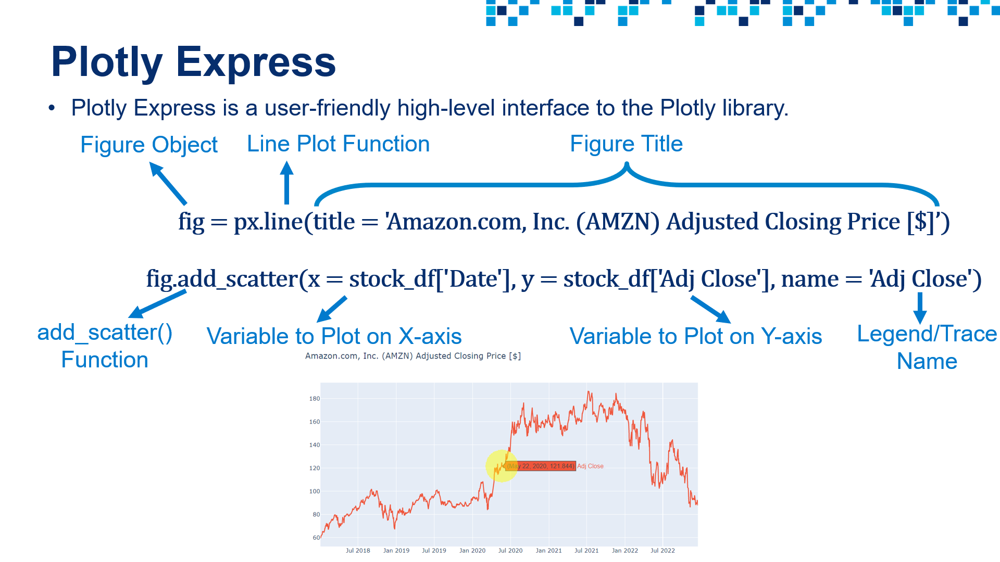

In [13]:
# Matplotlib is a comprehensive data visualization library in Python 
# Seaborn is a visualization library that sits on top of matplotlib and offers enhanced features 
# plotly.express module contains functions that can create interactive figures using a few lines of code

import matplotlib.pyplot as plt

#!pip install seaborn #uncomment this line to install seaborn if you don't have it already installed in your Python environment
import seaborn as sns

import plotly.express as px

%pip install "nbformat>=4.2.0"

Note: you may need to restart the kernel to use updated packages.


In [14]:
# Plot a Line Plot Using Plotly Express

import plotly.express as px

fig = px.line(
    stock_df,
    x="Date",
    y="Adj Close",
    title="Amazon.com, Inc. (AMZN) Adjusted Closing Price",
    labels={
        "Date": "Date",
        "Adj Close": "Adjusted Close Price ($)"
    }
)

fig.show()

#Course version:
    #fig = px.line(title = 'Amazon.com, Inc. (AMZN) Adjusted Closing Price [$]')
    #fig.add_scatter(x = stock_df['Date'], y = stock_df['Adj Close'], name = 'Adj Close')


In [15]:
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [16]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_financial_data(df, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

In [17]:
# Plot High, Low, Open, Close and Adj Close
plot_financial_data(stock_df.drop(['Volume', 'Daily Return'], axis = 1), 'Amazon.com, Inc. (AMZN) Stock Price [$]')

In [18]:
# Plot trading volume
plot_financial_data(stock_df.iloc[:,[0,5]], 'Amazon.com, Inc. (AMZN) Trading Volume')

In [19]:
# Plot % Daily Returns
plot_financial_data(stock_df.iloc[:,[0,7]], 'Amazon.com, Inc. (AMZN) Percentage Daily Return [%]')

**PRACTICE OPPORTUNITY:**
- **Plot the high, low, open, close and adjusted close price for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022 using Plotly Express library.**
- **Plot the trading volume for JPMorgan Chase & Co. stock during the same time period using Plotly Express Library.**
- **Plot the percentage daily return during the same time period using Plotly Express. Perform a sanity check by comparing the maximum percentage daily return calculated in the previous practice opportunity to the maximum value shown on the graph.**

In [20]:
# Plot the high, low, open, close and adjusted close price for JPMorgan Chase & Co. using Plotly Express library.
# Set Up: imports, pandas dataframe and adding percentage change column
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd

# 1. Read CSV
JPM_df = pd.read_csv('JPM.csv')

# 2. Create Daily Return column BECAUSE IT WASN'T THERE BEFORE
JPM_df['Daily Return'] = JPM_df['Adj Close'].pct_change() * 100


# Set Up plotly.express graph 
def plot_financial_data(df, title):
    fig = px.line(title=title)

    # skip Date column, plot every other column
    for i in df.columns[1:]:
        fig.add_scatter(x=df['Date'], y=df[i], name=i)
        fig.update_traces(line_width=5)
        fig.update_layout({'plot_bgcolor': "white"})
    
    fig.show()
# exclude Volume and Daily Return
plot_financial_data(
    JPM_df.drop(['Volume', 'Daily Return'], axis=1),
    'JPMorgan Chase & Co. Stock Price [$]'
)


In [21]:
# plot the high, low, open, close and adjusted close price for JPMorgan Chase & Co. using Plotly Express library.
# Set Up: imports, pandas dataframe and adding percentage change column
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd

# 1. Read CSV
JPM_df = pd.read_csv('JPM.csv')

# 2. Create Daily Return column BECAUSE IT WASN'T THERE BEFORE
JPM_df['Daily Return'] = JPM_df['Adj Close'].pct_change() * 100

# 3. Check dataframe
JPM_df

# Set Up plotly.express graph 
def plot_financial_data(df, title):
    fig = px.line(title=title)

    # skip Date column, plot every other column
    for i in df.columns[1:]:
        fig.add_scatter(x=df['Date'], y=df[i], name=i)
        fig.update_traces(line_width=5)
        fig.update_layout({'plot_bgcolor': "white"})
    
    fig.show()

# Only Date and Volume:
plot_financial_data(
    JPM_df[['Date', 'Volume']],
    'JPMorgan Chase & Co. Trading Volume')

In [22]:
#Plot the trading volume for JPMorgan Chase & Co. stock during the same time period using Plotly Express Library.

#Plot the percentage daily return during the same time period using Plotly Express. Perform a sanity check by comparing the maximum percentage daily return calculated in the previous practice opportunity to the maximum value shown on the graph.

# PERFORM DATA VISUALIZATION FOR A SINGLE STOCK: PART 2

In [23]:
# Define a function that classifies the returns based on the magnitude
# Feel free to change these numbers
def percentage_return_classifier(percentage_return): # function receives percentage return
    
    if percentage_return > -0.3 and percentage_return <= 0.3:
        return 'Insignificant Change'
    elif percentage_return > 0.3 and percentage_return <= 3:
        return 'Positive Change'
    elif percentage_return > -3 and percentage_return <= -0.3:
        return 'Negative Change'
    elif percentage_return > 3 and percentage_return <= 7:
        return 'Large Positive Change'
    elif percentage_return > -7 and percentage_return <= -3:
        return 'Large Negative Change'
    elif percentage_return > 7:
        return 'Bull Run'
    elif percentage_return <= -7:
        return 'Bear Sell Off'


# shift + enter... nothing happens because we haven't called the function yet.

In [24]:
# Apply the function to the pandas df for the "Daily Return" Column and place the result in "Trend" column
# concatenate .apply(function_we_just_defined) to pandas df
# pandas_df['new_column'] = pandas_df['specific_column'].apply(function_name)

stock_df['Trend'] = stock_df['Daily Return'].apply(percentage_return_classifier)
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant Change
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive Change
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive Change
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive Change
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive Change
...,...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive Change
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive Change
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative Change
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782,Large Negative Change


In [25]:
# Count distinct values in the Trend column
trend_summary = stock_df['Trend'].value_counts()

trend_summary

Trend
Positive Change          470
Negative Change          405
Insignificant Change     190
Large Positive Change     86
Large Negative Change     82
Bear Sell Off              9
Bull Run                   8
Name: count, dtype: int64

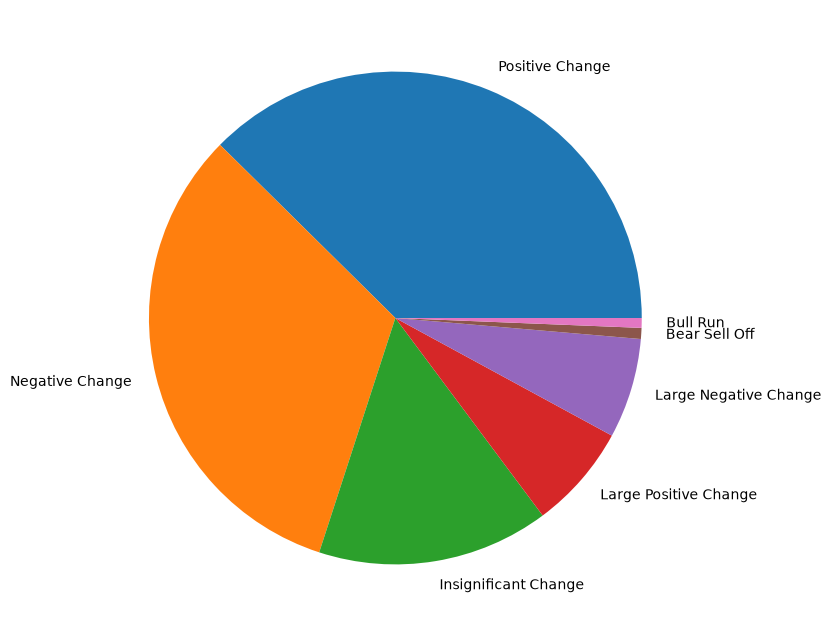

In [26]:
# Plot a pie chart using Matplotlib Library
plt.figure(figsize = (8, 8))
trend_summary.plot(kind = 'pie', y = 'Trend');

**PRACTICE OPPORTUNITY:**
- **Using Matplotlib library, plot a similar pie chart for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022.**

<Axes: >

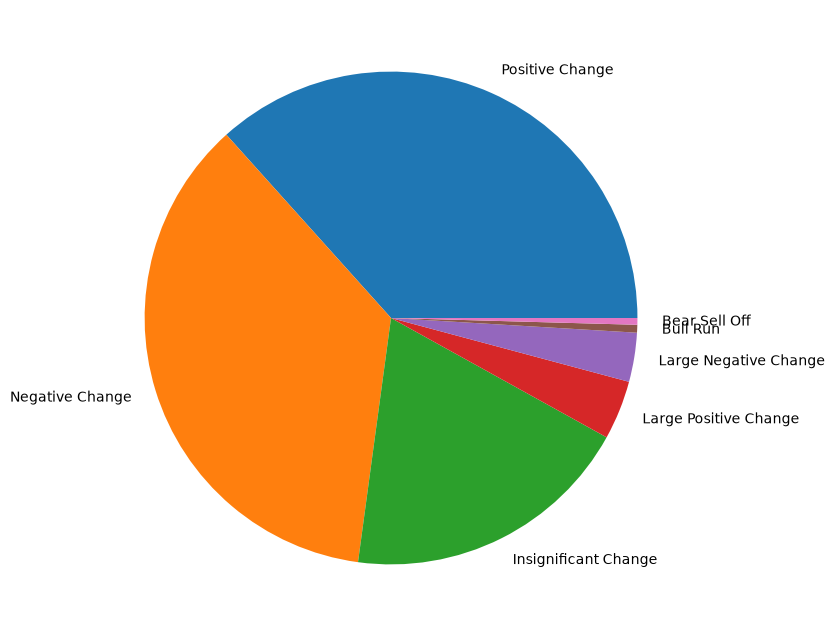

In [27]:
# jpm_df already exists but is missing a TREND column based on percentage return CLASSIFICATION.
# Make the function that defines the trend categories based on percentage return and apply it to the "Daily Return" column of jpm_df to create a new "Trend" column 

def percentage_return_classifier(percentage_return): # function receives percentage return
    
    if percentage_return > -0.3 and percentage_return <= 0.3:
        return 'Insignificant Change'
    elif percentage_return > 0.3 and percentage_return <= 3:
        return 'Positive Change'
    elif percentage_return > -3 and percentage_return <= -0.3:
        return 'Negative Change'
    elif percentage_return > 3 and percentage_return <= 7:
        return 'Large Positive Change'
    elif percentage_return > -7 and percentage_return <= -3:
        return 'Large Negative Change'
    elif percentage_return > 7:
        return 'Bull Run'
    elif percentage_return <= -7:
        return 'Bear Sell Off'
    

    # pie chart using plotly.express

jpm_df['Trend'] = jpm_df['Daily Return'].apply(percentage_return_classifier)

trend_summary_jpm = jpm_df['Trend'].value_counts()

# trend_summary_jpm # check counts for each trend category

plt.figure(figsize = (8, 8))
trend_summary_jpm.plot(kind = 'pie', y = 'Trend')

# PERFORM DATA VISUALIZATION FOR A SINGLE STOCK: PART 3

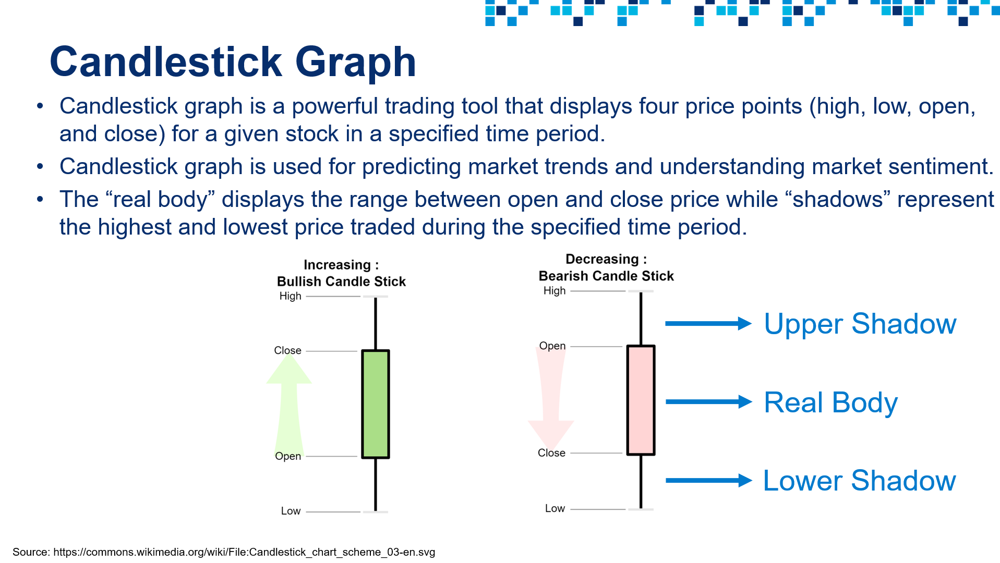

In [28]:
# Let's plot a candlestick graph to visualize a stock's price action
# Cufflinks (which used to connect Pandas and Plotly for one-line charting) is no longer maintained
# We use Plotly's graph_objects module directly instead, which gives full control over candlestick charts and technical indicators
import plotly.graph_objects as go


In [29]:
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant Change
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive Change
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive Change
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive Change
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive Change
...,...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive Change
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive Change
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative Change
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782,Large Negative Change


In [30]:
# Set the date to be the index for the Pandas DataFrame
# This is critical to show the date on the x-axis when using cufflinks
stock_df.set_index(['Date'], inplace = True)
stock_df

,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
Date,,,,,,,,
1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant Change
1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive Change
1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive Change
1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive Change
1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive Change
...,...,...,...,...,...,...,...,...
12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive Change
12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive Change
12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative Change


In [31]:
import plotly.graph_objects as go

# Plot Candlestick figure using Plotly's graph_objects module (modern replacement for the discontinued Cufflinks QuantFig)

df = stock_df.copy()
if 'Date' not in df.columns:
    df = df.reset_index()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date")

df["SMA_14"] = df["Close"].rolling(14).mean()
df["SMA_21"] = df["Close"].rolling(21).mean()

fig = go.Figure()

fig.add_candlestick(
    x=df["Date"],
    open=df["Open"],
    high=df["High"],
    low=df["Low"],
    close=df["Close"],
    name="AMZN"
)

fig.add_scatter(x=df["Date"], y=df["SMA_14"], name="14-Day SMA")
fig.add_scatter(x=df["Date"], y=df["SMA_21"], name="21-Day SMA")

fig.update_layout(
    title="Amazon.com, Inc. (AMZN) Candlestick Chart",
    xaxis_title="Date",
    yaxis_title="Price ($)",
    xaxis_rangeslider_visible=False
)

fig.show()


**PRACTICE OPPORTUNITY:**
- **Using Plotly, plot candlestick chart for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022. Remember to set the "Date" column as the index for "JPM_df" Pandas DataFrame.** 
- **Display the simple moving average with 30 and 100 days window on the previously generated candlestick graph.**
- **Display the Bollinger bands on a new candlestick graph. Bollinger bands are powerful technical analysis tool that contain 3 lines: (1) a simple moving average (middle band), (2) an upper and (3) a lower band. Choose a window length of 20 periods and 2 standard deviations. [external research is required]**

In [32]:
jpm_df # has index by default, and NaN values for Daily Return and Trend

,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return,Trend
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,NaN,NaN
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243,Negative Change
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140,Negative Change
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732,Insignificant Change
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000,Insignificant Change
...,...,...,...,...,...,...,...,...,...
1363,12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152,Positive Change
1364,12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867,Insignificant Change
1365,12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700,Negative Change
1366,12/15/2022,131.149994,132.080002,129.050003,130.100006,130.100006,12087800,-2.481072,Negative Change


In [33]:
# Only set the index if 'Date' is still a column
if 'Date' in jpm_df.columns:
    jpm_df.set_index('Date', inplace=True)

# 'Daily Return' and 'Trend' filling NaN values
jpm_df["Daily Return"] = jpm_df["Daily Return"].fillna(0) 
jpm_df["Trend"] = jpm_df["Trend"].fillna(0) 

# Apply the percentage return classifier function to the "Daily Return" column of jpm_df to create a new "Trend" column
jpm_df['Trend'] = jpm_df['Daily Return'].apply(percentage_return_classifier)

jpm_df

,Open,High,Low,Close,Adj Close,Volume,Daily Return,Trend
Date,,,,,,,,
7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,0.000000,Insignificant Change
7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243,Negative Change
7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140,Negative Change
7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732,Insignificant Change
7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000,Insignificant Change
...,...,...,...,...,...,...,...,...
12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152,Positive Change
12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867,Insignificant Change
12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700,Negative Change


In [34]:
# Plot Candlestick Figure using Plotly (modern replacement for the discontinued Cufflinks QuantFig)
import plotly.graph_objects as go

df = jpm_df.copy()
if 'Date' not in df.columns:
    df = df.reset_index()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date")

df["SMA_30"] = df["Close"].rolling(30).mean()
df["SMA_100"] = df["Close"].rolling(100).mean()

fig = go.Figure()

fig.add_candlestick(
    x=df["Date"],
    open=df["Open"],
    high=df["High"],
    low=df["Low"],
    close=df["Close"],
    name="JPM"
)

fig.add_scatter(x=df["Date"], y=df["SMA_30"], name="30-Day SMA")
fig.add_scatter(x=df["Date"], y=df["SMA_100"], name="100-Day SMA")

fig.update_layout(
    title="JPMorgan Chase and Co. Candlestick Chart",
    xaxis_title="Date",
    yaxis_title="Price ($)",
    xaxis_rangeslider_visible=False
)

fig.show()


In [35]:
# Bollinger bands (super useful to check volatility by standard deviation)
# Modern replacement for the discontinued Cufflinks QuantFig.add_bollinger_bands()
import plotly.graph_objects as go

df = jpm_df.copy()
if 'Date' not in df.columns:
    df = df.reset_index()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date")

window = 20
num_std = 2
df["BB_Mid"] = df["Close"].rolling(window).mean()
df["BB_Std"] = df["Close"].rolling(window).std()
df["BB_Upper"] = df["BB_Mid"] + num_std * df["BB_Std"]
df["BB_Lower"] = df["BB_Mid"] - num_std * df["BB_Std"]

fig = go.Figure()

fig.add_candlestick(
    x=df["Date"],
    open=df["Open"],
    high=df["High"],
    low=df["Low"],
    close=df["Close"],
    name="JPM"
)

fig.add_scatter(x=df["Date"], y=df["BB_Upper"], name="Upper Band", line=dict(color="blue"))
fig.add_scatter(x=df["Date"], y=df["BB_Mid"], name="20-Day SMA", line=dict(color="yellow"))
fig.add_scatter(x=df["Date"], y=df["BB_Lower"], name="Lower Band", line=dict(color="blue"))

fig.update_layout(
    title="JPMorgan Chase and Co. Candlestick with Bollinger Bands",
    xaxis_title="Date",
    yaxis_title="Price ($)",
    xaxis_rangeslider_visible=False
)

fig.show()


# PERFORM DATA VISUALIZATION FOR MULTIPLE STOCKS

In [36]:
# Let's read multiple stocks data contained in "stock_prices.csv" attached in the course package 
# The Appendix includes details on how to obtain this data using yfinance and Pandas Datareader 
# Note that yfinance and Pandas Datareader might experience outage in some geographical regions

# We will focus our analysis on U.S. stocks, similar analysis could be performed on Asian, European or African stocks  
# AMZN: Amazon Inc. - Multinational tech company focusing on e-commerce, cloud computing, and artificial intelligence
# JPM: JPMorgan Chase and Co. - Multinational investment bank and financial services holding company
# META: Meta Platforms, formerly named Facebook Inc. - META owns Facebook, Instagram, and WhatsApp
# PG: Procter and Gamble (P&G) - Multinational consumer goods corporation
# GOOG: Google (Alphabet Inc.) - Multinational company that focuses on search engine tech, e-commerce, Cloud and AI 
# CAT: Caterpillar - World's largest construction-equipment manufacturer
# PFE: Pfizer Inc. - Multinational pharmaceutical and biotechnology corporation
# EXC: Exelon - An American Fortune 100 energy company 
# DE: Deere & Company (John Deere) - Manufactures agricultural machinery and heavy equipment
# JNJ: Johnson & Johnson - A multinational corporation that develops medical devices and pharmaceuticals

close_price_df = pd.read_csv('stock_prices.csv')
close_price_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [37]:
# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df = close_price_df.iloc[:, 1:].pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df


,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...
2252,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [38]:
# Insert the date column at the start of the Pandas DataFrame (@ index = 0)
daily_returns_df.insert(0, "Date", close_price_df['Date'])
daily_returns_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1/3/2014,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,1/6/2014,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1/7/2014,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,1/8/2014,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,12/13/2022,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,12/14/2022,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,12/15/2022,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [39]:
# Plot closing prices using plotly Express. Note that we used the same pre-defined function "plot_financial_data"

# We already defined "plot_financial_data" before 

plot_financial_data(close_price_df, 'Adjusted Closing Prices [$]')

In [40]:
# Plot the stocks daily returns
plot_financial_data(daily_returns_df, 'Percentage Daily Returns [%]')

In [41]:
# Plot histograms for stocks daily returns using plotly express
# Compare META to JNJ daily returns histograms
fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor': "white"})

# Correlations Between Daily Returns

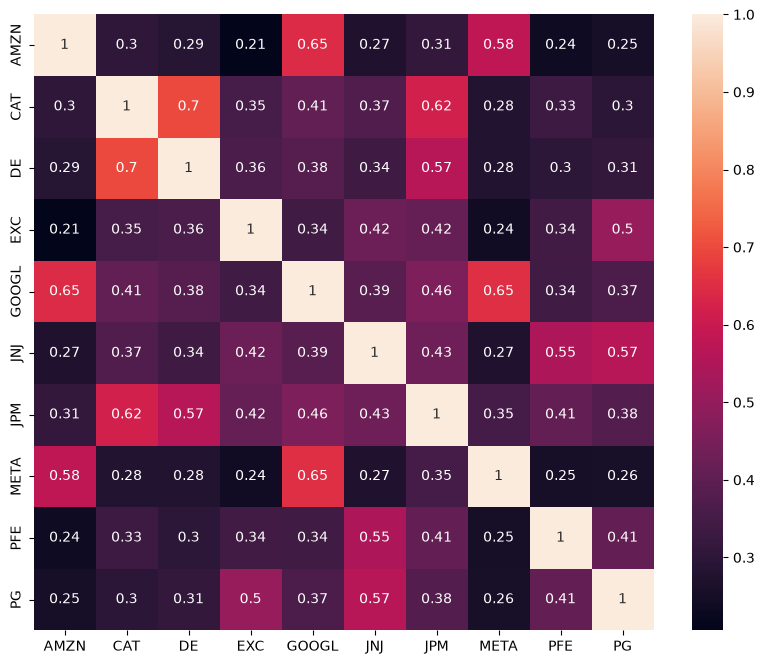

In [42]:
# Plot a heatmap showing the correlations between daily returns
# Strong positive correlations between Catterpillar and John Deere - both into heavy equipment and machinery
# META and Google - both into Tech and Cloud Computing
plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(), annot = True);

# Visually: scatterplots (linear correlations)

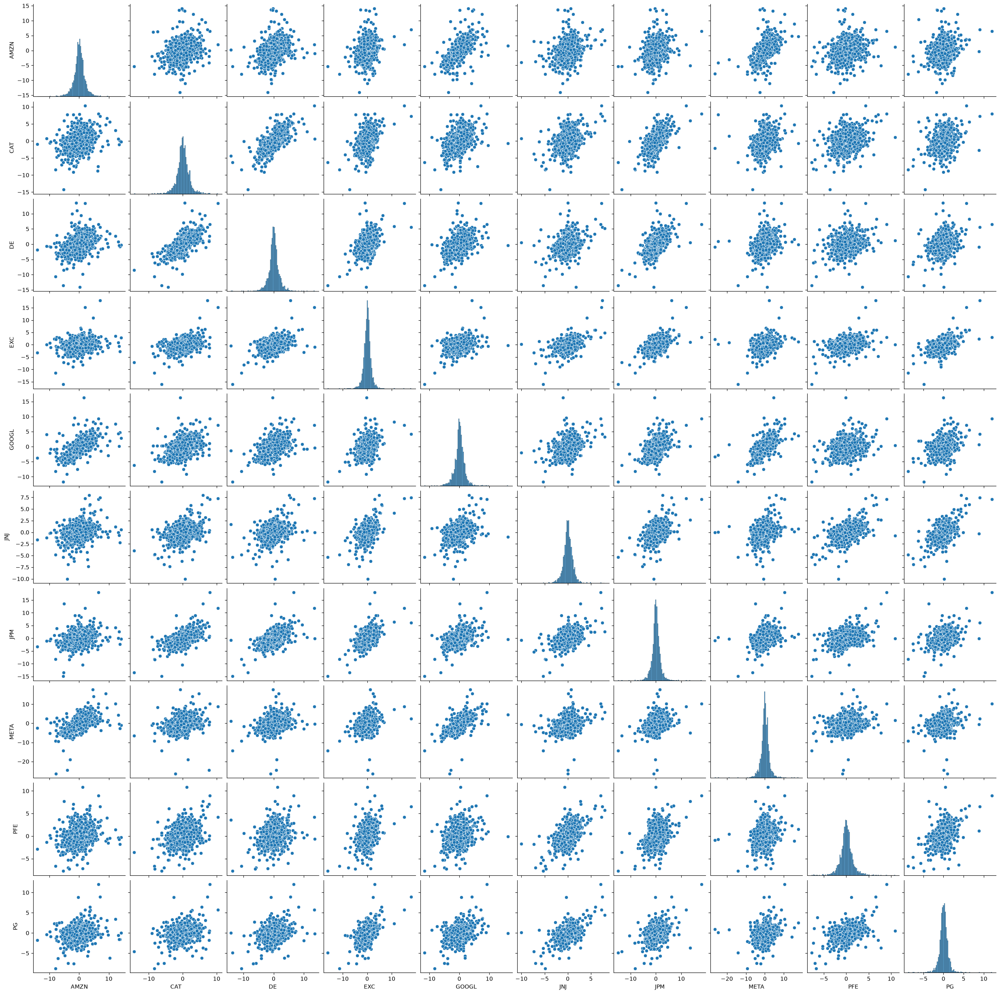

In [43]:
# Plot the Pairplot between stocks daily returns
sns.pairplot(daily_returns_df);

In [44]:
# Function to scale stock prices based on their initial starting price  
# The objective of this function is to set all prices to start at a value of 1 

def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [45]:
price_scaling(close_price_df)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


**PRACTICE OPPORTUNITY:**
- **Using "price_scaling" and "plot_financial_data" functions, plot the scaled data (closing prices) for all stocks.**
- **Based on the generated graph, which stock had the best and worst performance?** 

In [46]:
plot_financial_data(price_scaling(close_price_df), 'Adjusted Closing Prices Scaled to 1 [$]')

# DEFINE A FUNCTION THAT GENERATES RANDOM PORTFOLIO WEIGHTS

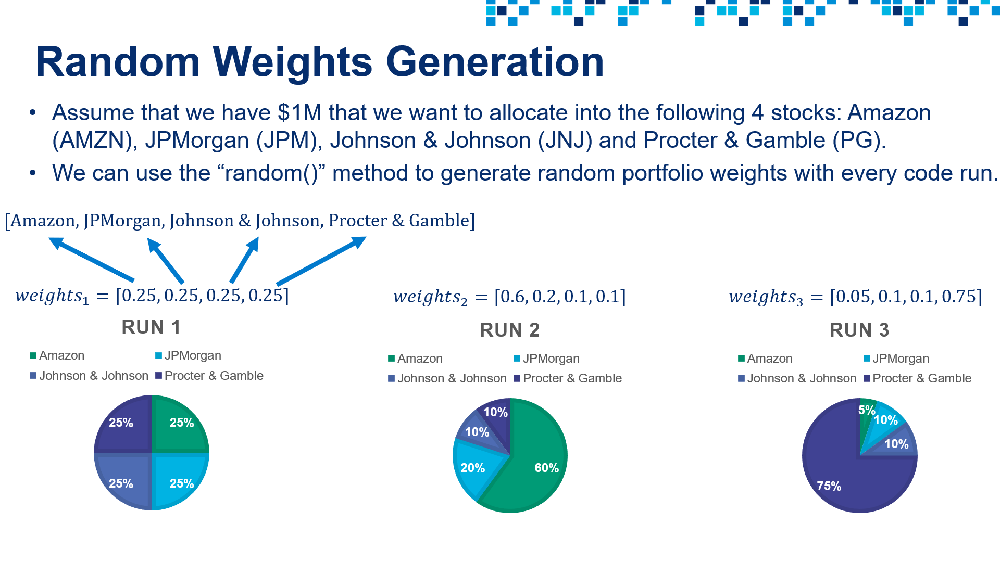

In [47]:
# test random library

import random
random.random() # generates random float number between 0 and 1

0.0877460106596607

In [48]:
# Let's create an array that holds random portfolio weights
# Note that portfolio weights must add up to 1 
import random

def generate_portfolio_weights(n): # n = number of weights
    weights = []
    for i in range(n):
        weights.append(random.random())
        
    # let's make the sum of all weights add up to 1
    weights = weights/np.sum(weights)
    return weights


# shift + enter nothing happens because we haven't called the function yet.
    # we only generated the weights proportionally to the total.

In [49]:
# Call the function (Run this cell multiple times to generate different outputs)
weights = generate_portfolio_weights(4)
print(weights)
print(weights.sum()) # check that the sum of weights is equal to 1 

[0.11812622 0.33251737 0.29299453 0.25636188]
0.9999999999999999


**PRACTICE OPPORTUNITY:**
- **Assume we now have 10 stocks under consideration, test the function using the new number of stocks.** 
- **Perform a sanity check and ensure that the sum of all weights is equal to 1.**

In [50]:
weights = generate_portfolio_weights(10)
print(weights)
print(weights.sum().round(2))
# Check that the sum of weights is equal to 1

[0.16337052 0.04835519 0.12725811 0.07889421 0.07779381 0.11905338
 0.11106712 0.00375015 0.0962237  0.1742338 ]
1.0


# PERFORM ASSET ALLOCATION & CALCULATE PORTFOLIO DAILY VALUE/RETURN

# Assume $1M invested

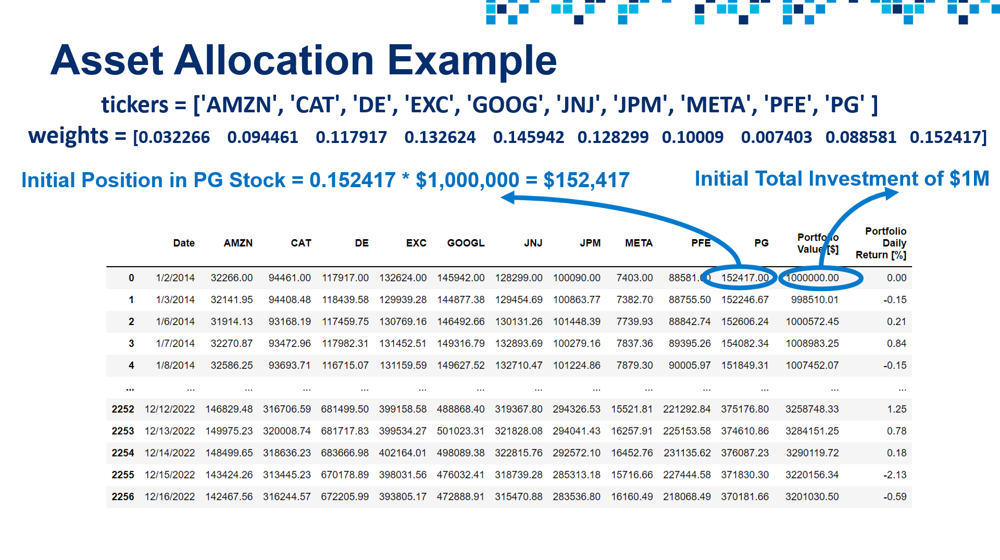

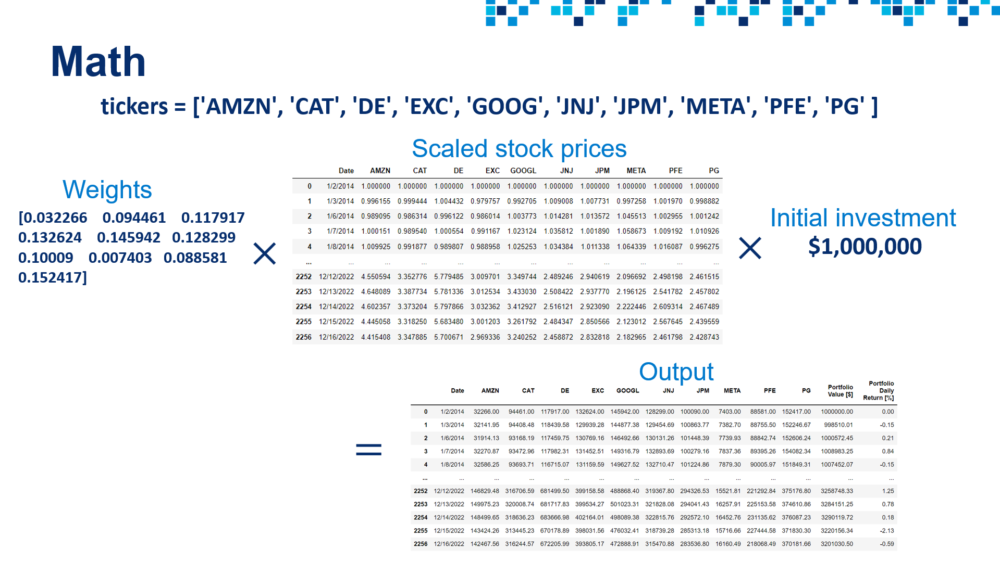

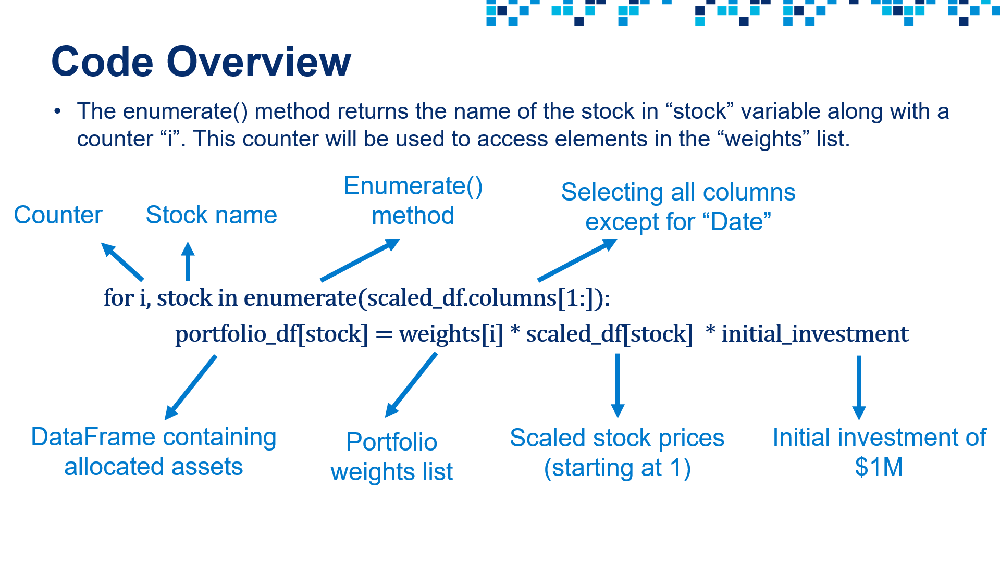

In [51]:
# Let's define the "weights" list similar to the slides, therefore, they are static and not randomly generated.

weights = [0.032266, 0.094461, 0.117917, 0.132624, 0.145942, 0.128299, 0.10009, 0.007403, 0.088581, 0.152417]
weights

[0.032266,
 0.094461,
 0.117917,
 0.132624,
 0.145942,
 0.128299,
 0.10009,
 0.007403,
 0.088581,
 0.152417]

In [52]:
# Let's display "close_price_df" Pandas DataFrame
close_price_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [53]:
# Scale stock prices using the "price_scaling" function that we defined earlier (make all stock values start at 1)
portfolio_df = close_price_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [54]:
# Use enumerate() method to obtain the stock names along with a counter "i" (0, 1, 2, 3,..etc.)
# This counter "i" will be used as an index to access elements in the "weights" list
initial_investment = 1000000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i] * scaled_df[stock]  * initial_investment
portfolio_df.round(1)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,32266.0,94461.0,117917.0,132624.0,145942.0,128299.0,100090.0,7403.0,88581.0,152417.0
1,1/3/2014,32142.0,94408.5,118439.6,129939.3,144877.4,129454.7,100863.8,7382.7,88755.5,152246.7
2,1/6/2014,31914.1,93168.2,117459.8,130769.2,146492.7,130131.3,101448.4,7739.9,88842.7,152606.2
3,1/7/2014,32270.9,93473.0,117982.3,131452.5,149316.8,132893.7,100279.2,7837.4,89395.3,154082.3
4,1/8/2014,32586.3,93693.7,116715.1,131159.6,149627.5,132710.5,101224.9,7879.3,90006.0,151849.3
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,146829.5,316706.6,681499.5,399158.6,488868.4,319367.8,294326.5,15521.8,221292.8,375176.8
2253,12/13/2022,149975.2,320008.7,681717.8,399534.3,501023.3,321828.1,294041.4,16257.9,225153.6,374610.9
2254,12/14/2022,148499.6,318636.2,683667.0,402164.0,498089.4,322815.8,292572.1,16452.8,231135.6,376087.2
2255,12/15/2022,143424.3,313445.2,670178.9,398031.6,476032.4,318739.3,285313.2,15716.7,227444.6,371830.3


In [55]:
# Assume that we have $1,000,000 that we would like to invest in one or more of the selected stocks
# Let's create a function that receives the following arguments: 
      # (1) Stocks closing prices
      # (2) Random weights 
      # (3) Initial investment amount
# The function will return a DataFrame that contains the following:
      # (1) Daily value (position) of each individual stock over the specified time period
      # (2) Total daily value of the portfolio 
      # (3) Percentage daily return 

def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    # Scale stock prices using the "price_scaling" function that we defined earlier (Make them all start at 1)
    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    # Sum up all values and place the result in a new column titled "portfolio value [$]" 
    # Note that we excluded the date column from this calculation
    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    # Calculate the portfolio percentage daily return and replace NaNs with zeros
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

In [56]:
# Now let's put this code in a function and generate random weights
# Let's obtain the number of stocks under consideration (note that we ignored the "Date" column) 
n = len(close_price_df.columns)-1

# Let's generate random weights 
print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Let's test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price_df, weights, 1000000)
portfolio_df.round(2)

Number of stocks under consideration = 10
Portfolio weights = [0.105915 0.028357 0.078772 0.001645 0.033025 0.135549 0.15573  0.151535
 0.180476 0.128998]


,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG,Portfolio Value [$],Portfolio Daily Return [%]
0,1/2/2014,105915.00,28357.00,78772.00,1645.00,33025.00,135549.00,155730.00,151535.00,180476.00,128998.00,1000002.00,0.00
1,1/3/2014,105507.81,28341.23,79121.10,1611.70,32784.09,136770.00,156933.91,151119.54,180831.52,128853.84,1001874.75,0.19
2,1/6/2014,104759.96,27968.90,78466.55,1621.99,33149.61,137484.80,157843.52,158431.77,181009.27,129158.17,1009894.52,0.80
3,1/7/2014,105930.97,28060.39,78815.63,1630.47,33788.68,140403.33,156024.31,160426.01,182134.99,130407.46,1017622.24,0.77
4,1/8/2014,106966.25,28126.66,77969.08,1626.84,33858.99,140209.76,157495.73,161284.65,183379.26,128517.54,1019434.75,0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,481976.20,95074.67,455261.57,4950.96,110625.31,337414.83,457942.56,317722.17,450864.71,317530.57,3029363.55,0.93
2253,12/13/2022,492302.33,96065.97,455407.42,4955.62,113375.83,340014.15,457498.97,332789.82,458730.63,317051.59,3068192.31,1.28
2254,12/14/2022,487458.64,95653.95,456709.51,4988.24,112711.91,341057.63,455212.84,336778.29,470918.50,318301.11,3079790.62,0.38
2255,12/15/2022,470798.36,94095.62,447699.07,4936.98,107720.67,336750.80,443918.69,321710.67,463398.34,314698.26,3005727.46,-2.40


In [57]:
# Plot the portfolio percentage daily return
plot_financial_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_financial_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_financial_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')

**PRACTICE OPPORTUNITY:** 
- **Generate 3 different random weights and perform asset allocation using the pre-defined "asset_allocation" function.** 
- **Compare the final portfolio value on December 16th, 2022 to the initial investment ($1M) on January 2nd, 2014. Comment on your results.**
- *Hint: you will need to run the code 3 different times and examine the results. No additional code is required.*

# DEFINE THE "SIMULATION" FUNCTION THAT PERFORMS ASSET ALLOCATION, AND CALCULATES KEY PORTFOLIO METRICS

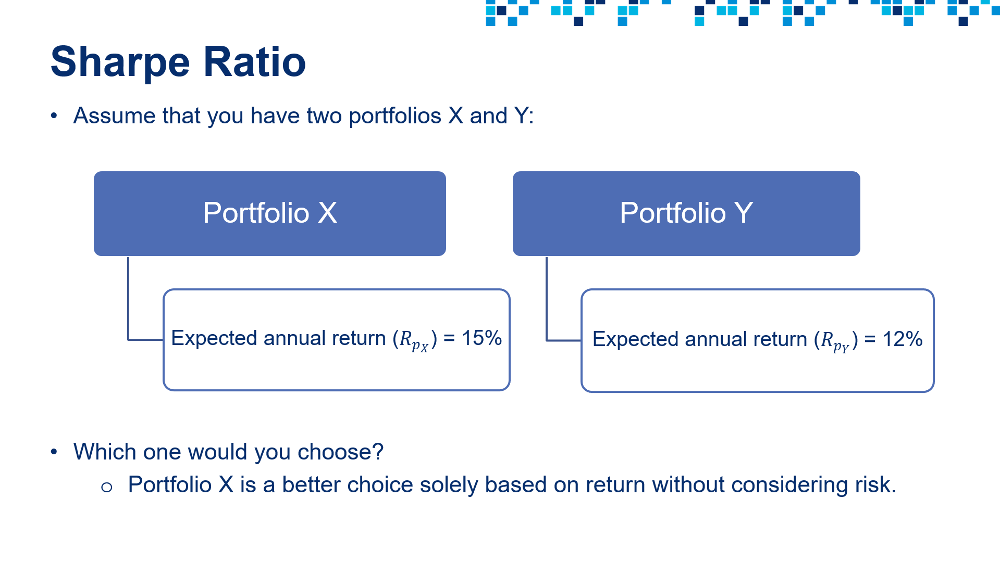

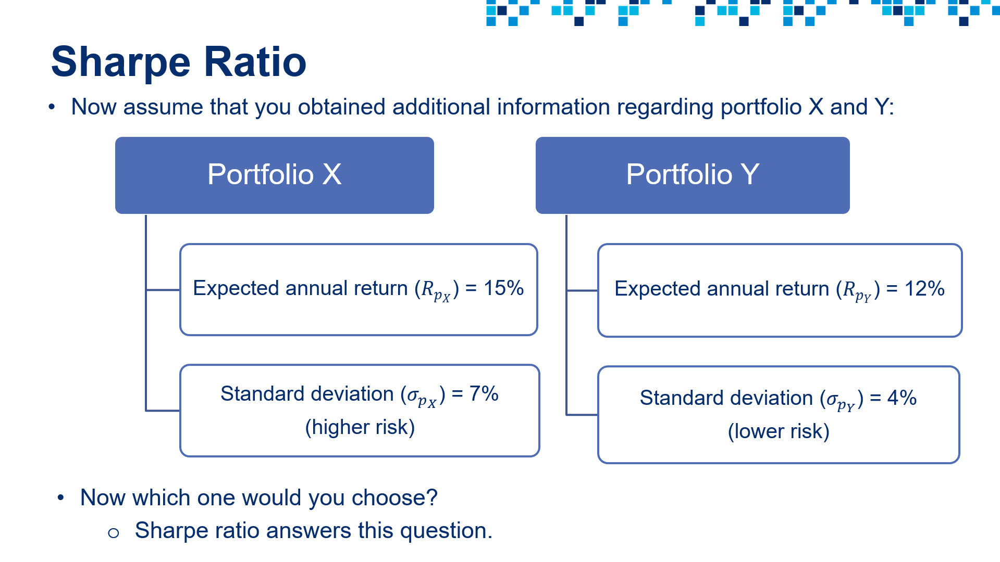

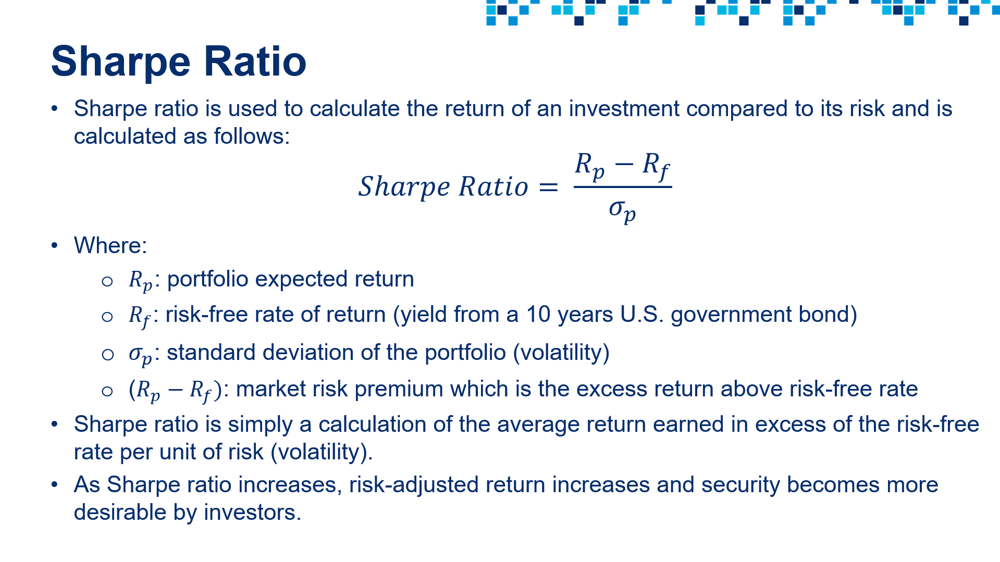

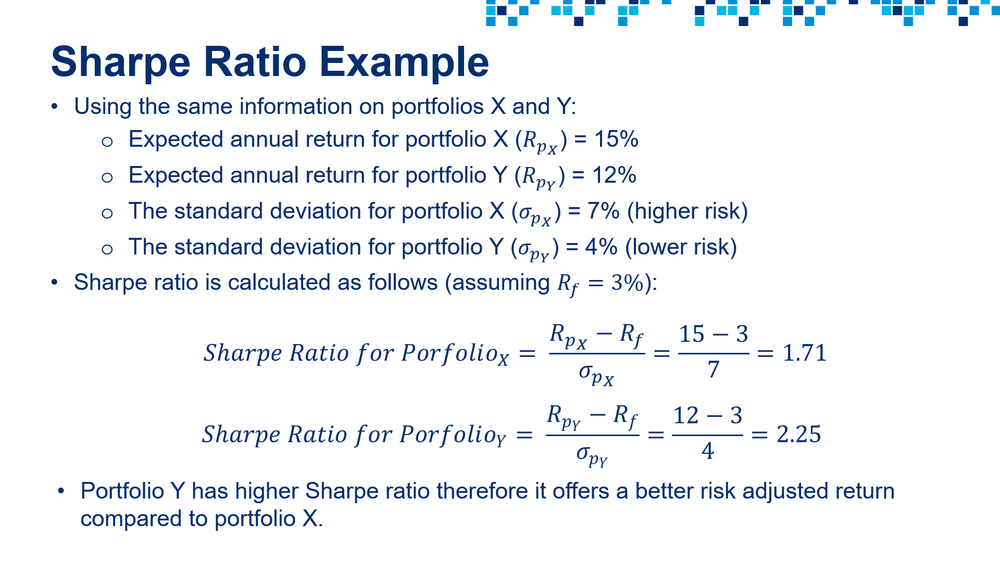

In [58]:
# Let's define the simulation engine function 
# The function receives: 
    # (1) portfolio weights
    # (2) initial investment amount
# The function performs asset allocation and calculates portfolio statistical metrics including Sharpe ratio
# The function returns: 
    # (1) Expected portfolio return 
    # (2) Expected volatility 
    # (3) Sharpe ratio 
    # (4) Return on investment 
    # (5) Final portfolio value in dollars


def simulation_engine(weights, initial_investment):
    # Perform asset allocation using the random weights (sent as arguments to the function)
    portfolio_df = asset_allocation(close_price_df, weights, initial_investment)
  
    # Calculate the return on the investment 
    # Return on investment is calculated using the last final value of the portfolio compared to its initial value
    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100
  
    # Daily change of every stock in the portfolio (Note that we dropped the date, portfolio daily worth and daily % returns) 
    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 
  
    # Portfolio Expected Return formula
    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
  
    # Portfolio volatility (risk) formula
    # The risk of an asset is measured using the standard deviation which indicates the dispertion away from the mean
    # The risk of a portfolio is not a simple sum of the risks of the individual assets within the portfolio
    # Portfolio risk must consider correlations between assets within the portfolio which is indicated by the covariance 
    # The covariance determines the relationship between the movements of two random variables
    # When two stocks move together, they have a positive covariance when they move inversely, the have a negative covariance 

    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    # Check out the chart for the 10-years U.S. treasury at https://ycharts.com/indicators/10_year_treasury_rate
    rf = 0.03 # Try to set the risk free rate of return to 1% (assumption)

    # Calculate Sharpe ratio
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]
  

In [59]:
# Let's test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [60]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))


Expected Portfolio Annual Return = 15.45%
Portfolio Standard Deviation (Volatility) = 17.93%
Sharpe Ratio = 0.69
Portfolio Final Value = $2986387.45
Return on Investment = 198.64%


**PRACTICE OPPORTUNITY:** 
- **Assume that you decided to perform equal asset allocation among the 10 available stocks in "portfolio_df" DataFrame. Complete the following tasks:** 
    - **Define a new "weights" list that contains equal allocation among all assets.**
    - **Call "simulation_engine" function and send it the new weights. Record the Sharpe ratio and portfolio final value.**
    - **Assume that the risk-free rate is now set to 1%. How does that change impact Sharpe ratio? confirm your answer by changing the risk free-rate, running the code, and recording the new Sharpe ratio.** 

# RUN MONTE CARLO SIMULATIONS 

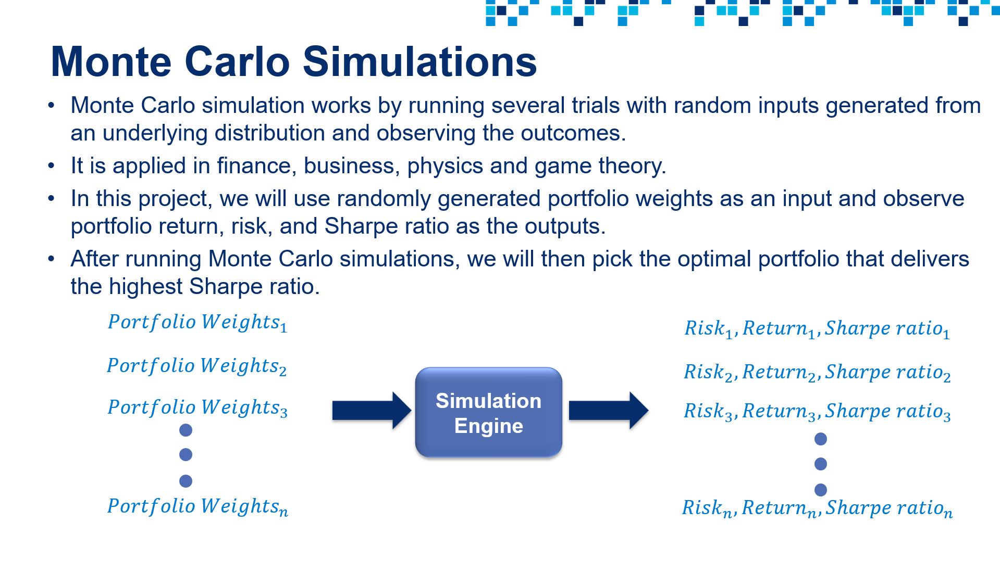

In [61]:
# Set the number of simulation runs
sim_runs = 10000
initial_investment = 1000000

# Placeholder to store all weights
weights_runs = np.zeros((sim_runs, n))

# Placeholder to store all Sharpe ratios
sharpe_ratio_runs = np.zeros(sim_runs)

# Placeholder to store all expected returns
expected_portfolio_returns_runs = np.zeros(sim_runs)

# Placeholder to store all volatility values
volatility_runs = np.zeros(sim_runs)

# Placeholder to store all returns on investment
return_on_investment_runs = np.zeros(sim_runs)

# Placeholder to store all final portfolio values
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    # Generate random weights 
    weights = generate_portfolio_weights(n)
    # Store the weights
    weights_runs[i,:] = weights
    
    # Call "simulation_engine" function and store Sharpe ratio, return and volatility
    # Note that asset allocation is performed using the "asset_allocation" function  
    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))   
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    print('\n')


Simulation Run = 0
Weights = [0.101 0.068 0.064 0.159 0.16  0.128 0.095 0.023 0.12  0.081], Final Value = $3158776.68, Sharpe Ratio = 0.74


Simulation Run = 1
Weights = [0.035 0.058 0.064 0.115 0.193 0.157 0.086 0.128 0.005 0.159], Final Value = $2988602.29, Sharpe Ratio = 0.69


Simulation Run = 2
Weights = [0.099 0.119 0.116 0.028 0.101 0.108 0.095 0.116 0.115 0.102], Final Value = $3230042.05, Sharpe Ratio = 0.73


Simulation Run = 3
Weights = [0.001 0.04  0.055 0.024 0.102 0.104 0.186 0.076 0.212 0.201], Final Value = $2807974.65, Sharpe Ratio = 0.67


Simulation Run = 4
Weights = [0.169 0.107 0.105 0.186 0.001 0.114 0.136 0.098 0.083 0.001], Final Value = $3344747.24, Sharpe Ratio = 0.75


Simulation Run = 5
Weights = [0.155 0.134 0.029 0.177 0.078 0.138 0.051 0.086 0.013 0.139], Final Value = $3118206.96, Sharpe Ratio = 0.73


Simulation Run = 6
Weights = [0.14  0.149 0.131 0.038 0.002 0.128 0.134 0.045 0.139 0.093], Final Value = $3346357.42, Sharpe Ratio = 0.76


Simulation Ru

**PRACTICE OPPORTUNITY:** 
- **Run Monte Carlo Simulations for 50 and 10000 runs.**
- **Record the minimum Sharpe ratio in each case. Comment on the results.**

# PERFORM PORTFOLIO OPTIMIZATION 

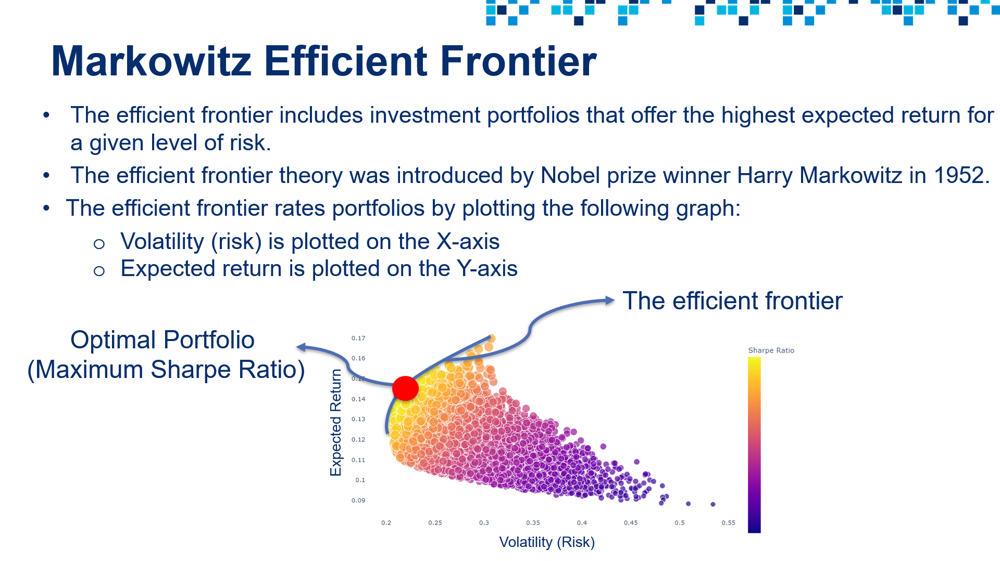

In [62]:
# List all Sharpe ratios generated from the simulation
sharpe_ratio_runs

array([0.7415117 , 0.69110219, 0.73040268, ..., 0.69072364, 0.71775892,
       0.76313673], shape=(10000,))

In [63]:
# Return the index of the maximum Sharpe ratio (Best simulation run) 
sharpe_ratio_runs.argmax()

np.int64(8279)

In [64]:
# Return the maximum Sharpe ratio value
sharpe_ratio_runs.max()

np.float64(0.8159854460730896)

In [65]:
weights_runs

array([[0.10065977, 0.06820522, 0.064495  , ..., 0.0232612 , 0.1204067 ,
        0.08095236],
       [0.03483627, 0.057945  , 0.06435817, ..., 0.12768717, 0.00531473,
        0.15878632],
       [0.09917101, 0.11925222, 0.11627082, ..., 0.11588866, 0.1152007 ,
        0.10201395],
       ...,
       [0.1085632 , 0.13394035, 0.01654322, ..., 0.14386523, 0.14108127,
        0.10036238],
       [0.14862969, 0.03243566, 0.03292109, ..., 0.08872544, 0.13501273,
        0.14387193],
       [0.22166026, 0.10096121, 0.13802156, ..., 0.06220554, 0.12385741,
        0.05451562]], shape=(10000, 10))

In [66]:
# Obtain the portfolio weights that correspond to the maximum Sharpe ratio (Golden set of weights!)
weights_runs[sharpe_ratio_runs.argmax(), :]

array([0.19741818, 0.00396081, 0.22504987, 0.1473244 , 0.06149605,
       0.06620449, 0.02541405, 0.03462864, 0.06438622, 0.17411727])

In [67]:
# Return Sharpe ratio, volatility corresponding to the best weights allocation (maximum Sharpe ratio)
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)

In [68]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 17.61%
  - Portfolio Standard Deviation (Volatility) = 17.91%
  - Sharpe Ratio = 0.82
  - Final Value = $3696362.52
  - Return on Investment = 269.64%


In [69]:
# Create a DataFrame that contains volatility, return, and Sharpe ratio for all simualation runs
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.174006,0.159027,0.741512
1,0.180109,0.154474,0.691102
2,0.183595,0.164098,0.730403
3,0.170753,0.144086,0.668138
4,0.187040,0.170261,0.749899
...,...,...,...
9995,0.176306,0.159755,0.735965
9996,0.181778,0.168609,0.762514
9997,0.181705,0.155508,0.690724
9998,0.172937,0.154127,0.717759


In [70]:
# Plot volatility vs. return for all simulation runs
# Highlight the volatility and return that corresponds to the highest Sharpe ratio
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.update_layout({'plot_bgcolor': "white"})
fig.show()


# Use this code if Sharpe ratio is negative
# fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )


In [71]:
# Let's highlight the point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

**PRACTICE OPPORTUNITY:**
- **Using Plotly Express, perform the following tasks:** 
     - **plot the portfolio volatility (y-axis) vs. simulation run number (x-axis)**
     - **Plot the portfolio return (y-axis) vs. simulation run number (x-axis)**
     -  **Plot the Sharpe ratio (y-axis) vs. simulation run number (x-axis)**
- **Perform a sanity check by identifying the optimal simulation run that results in the highest Sharpe ratio**

# PRACTICE OPPORTUNITIES SOLUTIONS:

**PRACTICE OPPORTUNITY SOLUTION:**
- **Using Pandas library, read JPMorgan Chase & Co. stock prices data contained in "JPM.csv" file and place it in a Pandas DataFrame**
- **Count the number of Null or missing values in the Pandas DataFrame**
- **What is the memory usage of this DataFrame?**

In [72]:
# Use Pandas to read stock data (the csv file is included in the course package) 
JPM_df = pd.read_csv('JPM.csv')
JPM_df

,Date,Open,High,Low,Close,Adj Close,Volume
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700
...,...,...,...,...,...,...,...
1363,12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600
1364,12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400
1365,12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100
1366,12/15/2022,131.149994,132.080002,129.050003,130.100006,130.100006,12087800


In [73]:
JPM_df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [74]:
JPM_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 1368 entries, 0 to 1367
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1368 non-null   str    
 1   Open       1368 non-null   float64
 2   High       1368 non-null   float64
 3   Low        1368 non-null   float64
 4   Close      1368 non-null   float64
 5   Adj Close  1368 non-null   float64
 6   Volume     1368 non-null   int64  
dtypes: float64(5), int64(1), str(1)
memory usage: 74.9 KB


**PRACTICE OPPORTUNITY SOLUTION:**
- **Using the adjusted closing price, calculate the percentage daily return for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022.**
- **Calculate the maximum percentage daily return for JPMorgan Chase & Co. stock over the same time period.**

In [75]:
# Calculate the percentage daily return
# Note that we had to replace the first row with zeros instead of NaN
JPM_df['Daily Return'] = JPM_df['Adj Close'].pct_change(1) * 100
JPM_df['Daily Return'] = JPM_df['Daily Return'].replace(np.nan, 0)
JPM_df


,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,0.000000
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000
...,...,...,...,...,...,...,...,...
1363,12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152
1364,12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867
1365,12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700
1366,12/15/2022,131.149994,132.080002,129.050003,130.100006,130.100006,12087800,-2.481072


In [76]:
JPM_df.describe()

,Open,High,Low,Close,Adj Close,Volume,Daily Return
count,1368.000000,1368.000000,1368.000000,1368.000000,1368.000000,1.368000e+03,1368.000000
mean,120.672434,121.882880,119.455768,120.650168,112.181658,1.441361e+07,0.054777
std,21.824789,21.913014,21.709343,21.808955,23.815861,6.503746e+06,1.956449
min,81.559998,83.750000,76.910004,79.029999,72.579208,3.220500e+06,-14.964889
25%,104.732498,105.699997,103.730003,104.757502,93.908926,1.022870e+07,-0.827327
50%,114.514999,115.405003,113.439999,114.535000,102.741505,1.285545e+07,0.000000
75%,134.887497,136.447495,133.935001,135.292496,128.463585,1.635760e+07,0.955456
max,172.710007,172.960007,170.539993,171.779999,166.523987,5.441880e+07,18.012496


**PRACTICE OPPORTUNITY SOLUTION:**
- **Plot the high, low, open, close and adjusted close price for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022 using Plotly Express library.**
- **Plot the trading volume for JPMorgan Chase & Co. stock during the same time period using Plotly Express Library.**
- **Plot the percentage daily return during the same time period using Plotly Express. Perform a sanity check by comparing the maximum percentage daily return calculated in the previous practice opportunity to the maximum value shown on the graph.**

In [77]:
JPM_df

,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,0.000000
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000
...,...,...,...,...,...,...,...,...
1363,12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152
1364,12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867
1365,12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700
1366,12/15/2022,131.149994,132.080002,129.050003,130.100006,130.100006,12087800,-2.481072


In [78]:
# Plot interactive chart
plot_financial_data(JPM_df.drop(['Volume', 'Daily Return'], axis = 1), 'JPMorgan Chase & Co. Stock Price [$]')

In [79]:
# Plot trading volume (Note that the position of the Volume column is different compared to Amazon's DataFrame)
plot_financial_data(JPM_df.iloc[:,[0,6]], 'JPMorgan Chase & Co. Trading Volume')

In [80]:
# Plot % Daily Returns
plot_financial_data(JPM_df.iloc[:,[0,7]], 'JPMorgan Chase & Co. Percentage Daily Return [%]')

**PRACTICE OPPORTUNITY SOLUTION:**
- **Using Matplotlib library, plot a similar pie chart for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022.**

In [81]:
# Apply the function to the "Daily Return" Column and place the result in "Trend" column
JPM_df['Trend'] = JPM_df['Daily Return'].apply(percentage_return_classifier)
JPM_df

,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return,Trend
0,7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,0.000000,Insignificant Change
1,7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243,Negative Change
2,7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140,Negative Change
3,7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732,Insignificant Change
4,7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000,Insignificant Change
...,...,...,...,...,...,...,...,...,...
1363,12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152,Positive Change
1364,12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867,Insignificant Change
1365,12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700,Negative Change
1366,12/15/2022,131.149994,132.080002,129.050003,130.100006,130.100006,12087800,-2.481072,Negative Change


In [82]:
# Count distinct values in the Trend column
trend_summary = JPM_df['Trend'].value_counts()
trend_summary

Trend
Positive Change          501
Negative Change          495
Insignificant Change     262
Large Positive Change     53
Large Negative Change     44
Bull Run                   7
Bear Sell Off              6
Name: count, dtype: int64

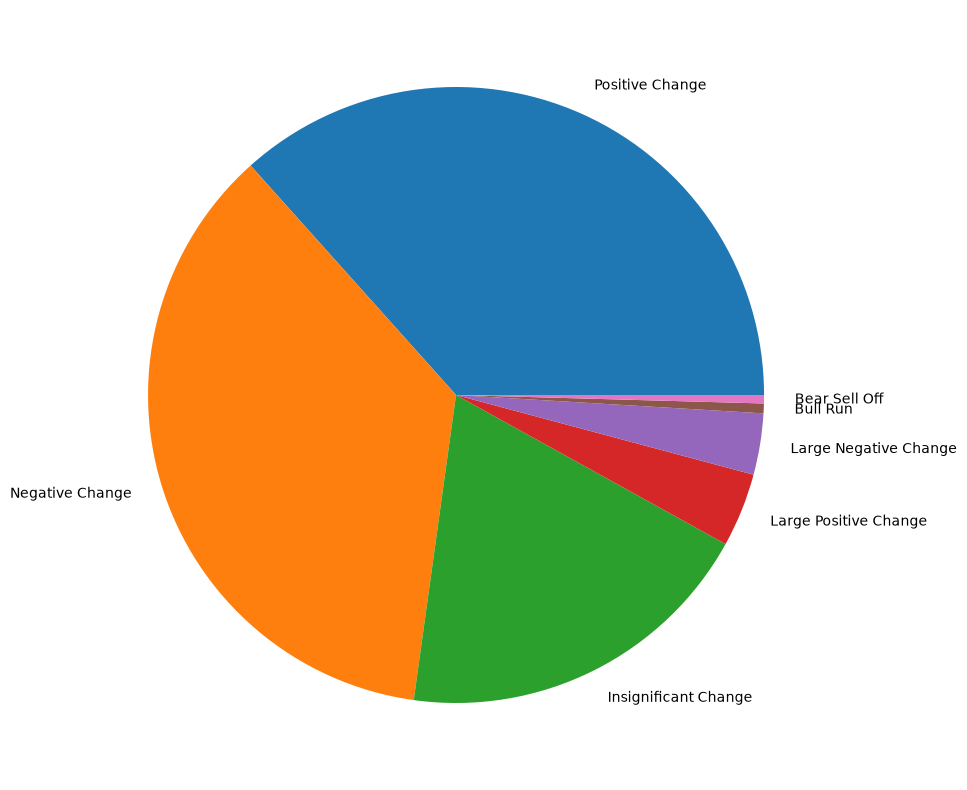

In [83]:
# Plot a pie chart using Matplotlib Library
plt.figure(figsize = (10, 10))
trend_summary.plot(kind = 'pie', y = 'Trend');

**PRACTICE OPPORTUNITY SOLUTION:**
- **Using Plotly, plot candlestick chart for JPMorgan Chase & Co. stock starting from July 14th, 2017 until December 16th, 2022. Remember to set the "Date" column as the index for "JPM_df" Pandas DataFrame.** 
- **Display the simple moving average with 30 and 100 days window on the previously generated candlestick graph.**
- **Display the Bollinger bands on a new candlestick graph. Bollinger bands are powerful technical analysis tool that contain 3 lines: (1) a simple moving average (middle band), (2) an upper and (3) a lower band. Choose a window length of 20 periods and 2 standard deviations. [external research is required]**

In [84]:
# Set the date to be the index for the Pandas DataFrame
# This is critical to show the date on the x-axis when using cufflinks
JPM_df.set_index(['Date'], inplace = True)
JPM_df

,Open,High,Low,Close,Adj Close,Volume,Daily Return,Trend
Date,,,,,,,,
7/14/2017,90.809998,92.610001,90.580002,92.250000,79.338943,22235200,0.000000,Insignificant Change
7/17/2017,91.820000,91.989998,91.250000,91.389999,78.599312,14374200,-0.932243,Negative Change
7/18/2017,90.449997,91.580002,90.320000,91.070000,78.324104,14719400,-0.350140,Negative Change
7/19/2017,91.339996,91.620003,91.000000,91.199997,78.435898,11651200,0.142732,Insignificant Change
7/20/2017,91.150002,91.720001,90.900002,91.199997,78.435898,11561700,0.000000,Insignificant Change
...,...,...,...,...,...,...,...,...
12/12/2022,132.399994,134.649994,131.600006,134.210007,134.210007,8841600,1.551152,Positive Change
12/13/2022,136.889999,137.089996,133.080002,134.080002,134.080002,10025400,-0.096867,Insignificant Change
12/14/2022,133.779999,135.710007,132.759995,133.410004,133.410004,9966100,-0.499700,Negative Change


In [85]:
# Plot Candlestick Figure using Plotly (modern replacement for the discontinued Cufflinks QuantFig)
import plotly.graph_objects as go

df = JPM_df.copy()
if 'Date' not in df.columns:
    df = df.reset_index()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date")

df["SMA_30"] = df["Close"].rolling(30).mean()
df["SMA_100"] = df["Close"].rolling(100).mean()

fig = go.Figure()

fig.add_candlestick(
    x=df["Date"],
    open=df["Open"],
    high=df["High"],
    low=df["Low"],
    close=df["Close"],
    name="JPM"
)

fig.add_scatter(x=df["Date"], y=df["SMA_30"], name="30-Day SMA")
fig.add_scatter(x=df["Date"], y=df["SMA_100"], name="100-Day SMA")

fig.update_layout(
    title="JPMorgan and Chase Co. Candlestick Chart",
    xaxis_title="Date",
    yaxis_title="Price ($)",
    xaxis_rangeslider_visible=False
)

fig.show()


In [86]:
# Plot Candlestick figure with Bollinger Bands using Plotly (modern replacement for the discontinued Cufflinks QuantFig)
import plotly.graph_objects as go

df = JPM_df.copy()
if 'Date' not in df.columns:
    df = df.reset_index()
df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values("Date")

window = 20
num_std = 2
df["BB_Mid"] = df["Close"].rolling(window).mean()
df["BB_Std"] = df["Close"].rolling(window).std()
df["BB_Upper"] = df["BB_Mid"] + num_std * df["BB_Std"]
df["BB_Lower"] = df["BB_Mid"] - num_std * df["BB_Std"]

fig = go.Figure()

fig.add_candlestick(
    x=df["Date"],
    open=df["Open"],
    high=df["High"],
    low=df["Low"],
    close=df["Close"],
    name="JPM"
)

fig.add_scatter(x=df["Date"], y=df["BB_Upper"], name="Upper Band", line=dict(color="blue"), fill=None)
fig.add_scatter(x=df["Date"], y=df["BB_Lower"], name="Lower Band", line=dict(color="blue"), fill="tonexty")
fig.add_scatter(x=df["Date"], y=df["BB_Mid"], name="20-Day SMA", line=dict(color="yellow"))

fig.update_layout(
    title="JPMorgan and Chase Co. Candlestick Chart with Bollinger Bands",
    xaxis_title="Date",
    yaxis_title="Price ($)",
    xaxis_rangeslider_visible=False
)

fig.show()


**PRACTICE OPPORTUNITY SOLUTION:**
- **Using "price_scaling" and "plot_financial_data" functions, plot the scaled data for all stocks.**
- **Based on the generated graph, which stock had the best and worst performance?** 

In [87]:
# Plot scaled stock prices
plot_financial_data(price_scaling(close_price_df), 'Scaled Stock Closing Prices [$]')

**PRACTICE OPPORTUNITY SOLUTION:**
- **Assume we now have 10 stocks under consideration, test the function using the new number of stocks.** 
- **Perform a sanity check and ensure that the sum of all weights is equal to 1.**

In [88]:
# Call the function (Run this cell multiple times to generate different outputs)
weights = generate_portfolio_weights(10)
print(weights)

[0.19342205 0.1785599  0.09542084 0.08353402 0.09497182 0.03179999
 0.04980044 0.00136109 0.11242243 0.15870741]


In [89]:
# If you sum up all random weights, they should add up to 1
weights.sum()

np.float64(1.0)

**PRACTICE OPPORTUNITY SOLUTION:** 
- **Generate 3 different random weights and perform asset allocation using the pre-defined "asset_allocation" function.** 
- **Compare the final portfolio value on December 16th, 2022 to the initial investment ($1M) on January 2nd, 2014. Comment on your results.**
- *Hint: you will need to run the code 3 different times and examine the results. No additional code is required.*

In [90]:
# Run the code 3 times and record the final value of the portfolio along with the weights 

# Portfolio Final Value in Run #1 = , weights = 
# Portfolio Final Value in Run #2 = , weights = 
# Portfolio Final Value in Run #3 = , weights = 


**PRACTICE OPPORTUNITY SOLUTION:** 
- **Assume that you decided to perform equal asset allocation among the 10 available stocks in "portfolio_df" DataFrame. Complete the following tasks:** 
    - **Define a new "weights" list that contains equal allocation among all assets.**
    - **Call "simulation_engine" function and send it the new weights. Record the Sharpe ratio and portfolio final value.**
    - **Assume that the risk-free rate is now set to 1%. How does that change impact Sharpe ratio? confirm your answer by changing the risk free-rate, running the code, and recording the new Sharpe ratio.** 

In [91]:
# Assume equal weights allocation
weights = np.ones(10) * 0.1
weights

array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

In [92]:
# Let's test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 16.30%
Portfolio Standard Deviation (Volatility) = 18.02%
Sharpe Ratio = 0.74
Portfolio Final Value = $3203874.76
Return on Investment = 220.39%


In [93]:
# Portfolio performance with equal weights allocation (Rf = 3%)
    # Expected Portfolio Annual Return = 16.30%
    # Portfolio Standard Deviation (Volatility) = 18.02%
    # Sharpe Ratio = 0.74
    # Portfolio Final Value = $3203874.76
    # Return on Investment = 220.39%


# Portfolio performance with equal weights allocation (Rf = 1%)
    # Expected Portfolio Annual Return = 16.30%
    # Portfolio Standard Deviation (Volatility) = 18.02%
    # Sharpe Ratio = 0.85
    # Portfolio Final Value = $3203874.76
    # Return on Investment = 220.39%
    
# For the same portfolio (with similar weights), lowering the risk-free rate will increase Sharpe ratio. 

**PRACTICE OPPORTUNITY SOLUTION:** 
- **Run Monte Carlo Simulations for 50 and 10000 runs.**
- **Record the minimum Sharpe ratio in each case. Comment on the results.**

In [94]:
# Return the minimum Sharpe ratio
sharpe_ratio_runs.min().round(4)
# Min Sharpe Ratio after 50 runs = 0.6406
# Min Sharpe Ratio after 10,000 runs = 0.5838

np.float64(0.5737)

**PRACTICE OPPORTUNITY SOLUTION:**
- **Using Plotly Express, perform the following tasks:** 
     - **plot the portfolio volatility (y-axis) vs. simulation run number (x-axis)**
     - **Plot the portfolio return (y-axis) vs. simulation run number (x-axis)**
     -  **Plot the Sharpe ratio (y-axis) vs. simulation run number (x-axis)**
- **Perform a sanity check by identifying the optimal simulation run that results in the highest Sharpe ratio**

In [95]:
# Plot interactive plot for volatility
fig = px.line(sim_out_df, y = 'Volatility')
fig.show()

In [96]:
# Plot interactive plot for Portfolio Return
fig = px.line(sim_out_df, y = 'Portfolio_Return')
fig.update_traces(line_color = 'red')
fig.show()

In [97]:
# Plot interactive plot for Portfolio Return
fig = px.line(sim_out_df, y = 'Sharpe_Ratio')
fig.update_traces(line_color = 'purple')
fig.show()

# EXCELLENT JOB

# APPENDIX

In [98]:
# Code to obtain stock data using yfinance
# Select the start/end dates and ticker symbols
# Data is saved in a stock_data.csv file
tickers = ['AMZN', 'JPM', 'META', 'PG', 'GOOGL', 'CAT', 'PFE', 'EXC', 'DE', 'JNJ']
tickers = ['AMZN']

import yfinance as yf

# Indicate the start and end dates
start = dt.datetime(2018, 1, 1)
end = dt.datetime.now()

df = yf.download(tickers, start = start, end = end)
print(df)
df.to_csv('stock_data.csv')


[*********************100%***********************]  1 of 1 completed

Price            Close        High         Low        Open    Volume
Ticker            AMZN        AMZN        AMZN        AMZN      AMZN
Date                                                                
2018-01-02   59.450500   59.500000   58.525501   58.599998  53890000
2018-01-03   60.209999   60.274502   59.415001   59.415001  62176000
2018-01-04   60.479500   60.793499   60.233002   60.250000  60442000
2018-01-05   61.457001   61.457001   60.500000   60.875500  70894000
2018-01-08   62.343498   62.653999   61.601501   61.799999  85590000
...                ...         ...         ...         ...       ...
2026-09-11  256.779999  257.589996  253.139999  254.089996  26724100
2026-09-14  253.539993  255.949997  250.740005  253.149994  34352800
2026-09-15  248.419998  253.270004  247.220001  252.240005  36275400
2026-09-16  245.960007  249.259995  244.300003  248.100006  33488500
2026-09-17         NaN         NaN         NaN         NaN  29639613

[2189 rows x 5 columns]
